## Load notebook

### Python modules

In [4]:
# standard libs
import numpy as np
import pandas as pd
from scipy import sparse
import lmfit as lm
from tqdm import tqdm
import io, sys, importlib
from contextlib import redirect_stdout
from scipy.ndimage import binary_dilation

# matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
plt.rcParams['font.size'], plt.rcParams['axes.labelsize'] = 14, 18

# XPCS library
sys.path.append('./XPCSlibrary/')

import ID10tools as ID10
from ID10tools import Nx, Ny, Npx
importlib.reload(ID10)
ID10.set_version('v2')

import XPCStools as XPCS
from XPCStools import E2lambda, lambda2E, theta2Q, Q2theta, decorrelation_f
importlib.reload(XPCS)
XPCS.set_beamline('ID10')

import COSMICRAYtools as COSMIC
importlib.reload(COSMIC)
COSMIC.set_beamline('ID10')

#### EXPERIMENTAL VARIABLES ####
XPCS.set_expvar(1350, 1350, 7.1)
ID10.Nfmax_dense_file = 2000
ID10.Nfmax_sparse_file = 5000
################################

###### FOLDER PATHS ######
from folder_paths import *
##########################

### Load e4m masks

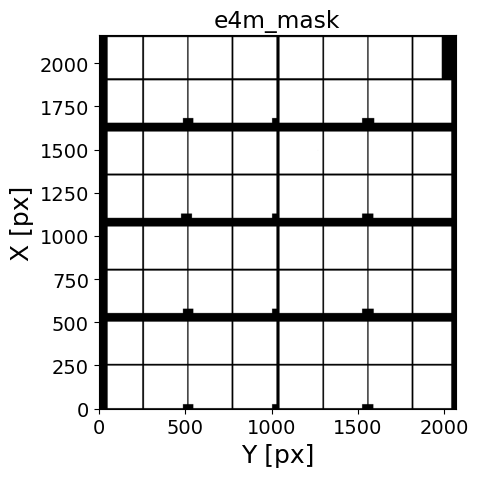

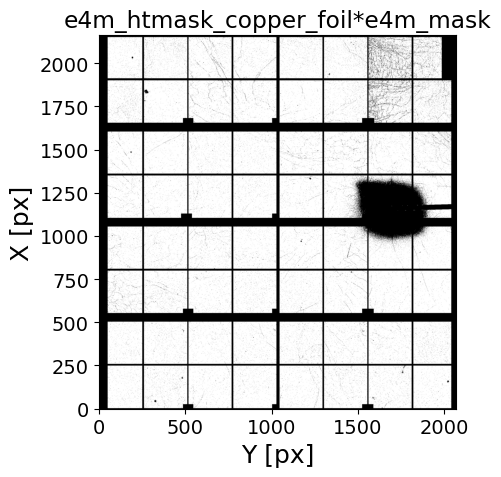

In [5]:
### e4m MASKS
e4m_htmask_copper_foil = np.load(MASKS_folder+'e4m_htmask_copper_foil_30um_1_1'+'.npy')
e4m_mask = np.load(MASKS_folder+'e4m_mask'+'.npy')

plt.figure(figsize=(5, 5))
plt.imshow((e4m_mask).reshape(Nx,Ny), cmap='gray', origin='lower')
plt.xlabel('Y [px]')
plt.ylabel('X [px]')
plt.title('e4m_mask')
plt.tight_layout(); plt.show()

plt.figure(figsize=(5, 5))
plt.imshow((e4m_htmask_copper_foil*e4m_mask).reshape(Nx,Ny), cmap='gray', origin='lower')
plt.xlabel('Y [px]')
plt.ylabel('X [px]')
plt.title('e4m_htmask_copper_foil*e4m_mask')
plt.tight_layout()

# Load data

## Beamstop mask

In [6]:
#######################################
sample_name = 'GeO2_7_30C'
Ndataset = 3
Nscan = 3
#######################################

In [7]:
#######################################
Nfi, Nff = 0, 1000
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1 loops)
Done! (elapsed time = 0.05 s)
Concatenating vectors ...
Done! (elapsed time = 0.01 s)
	 | Sparse array loaded from ../RAW_DATA/GeO2_7_30C/GeO2_7_30C_0003/scan0003/
	 | Shape:       (1000, 4471016)
	 | Sparsity:     1.5e-04
	 | Memory usage (scipy.csr_array): 0.007 GB (np.array usage: 16.656 GB)


################################################################################
Maximum count in the whole run -> 242.0
# of pixels above Ith_high treshold ->  610960 pixels (of 4471016 => 13.66 %)
################################################################################



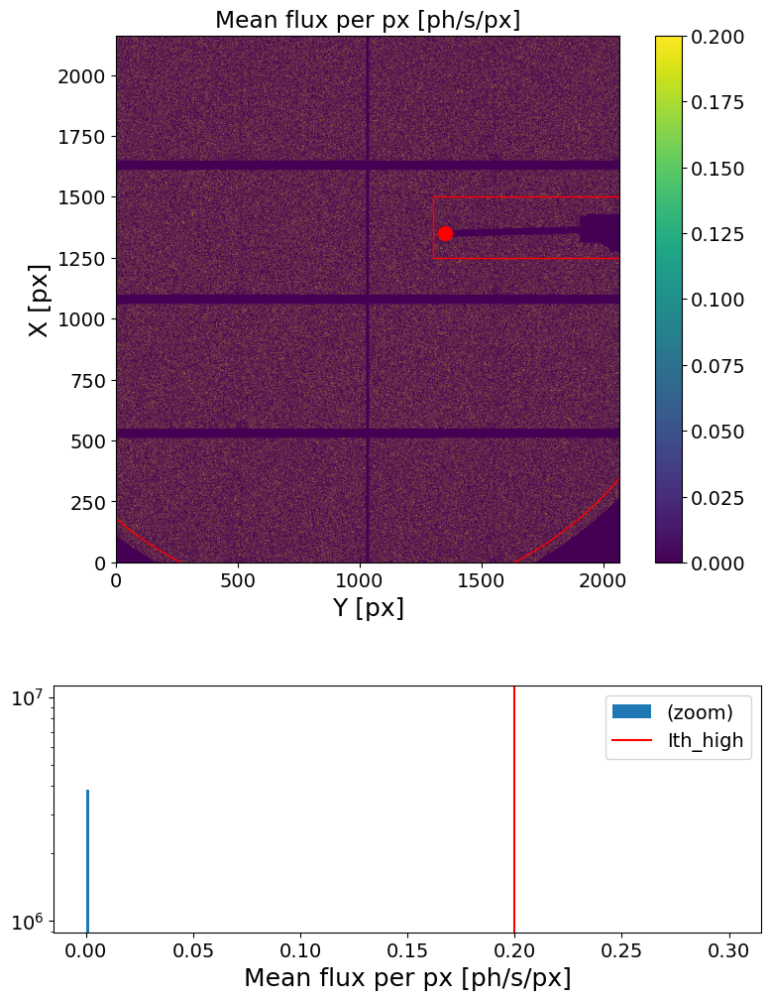

In [8]:
geom = [{'geom':'Rectangle', 'x0':1250, 'y0':1300, 'xl':250, 'yl':1950, 'inside':False},
        {'geom':'Circle', 'Cx':1300, 'Cy':950, 'r':1470, 'inside':True}, 
        ]
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.2, mask_geom=geom,)

#################################################
Masked area =  93.74594052000708 %
#################################################



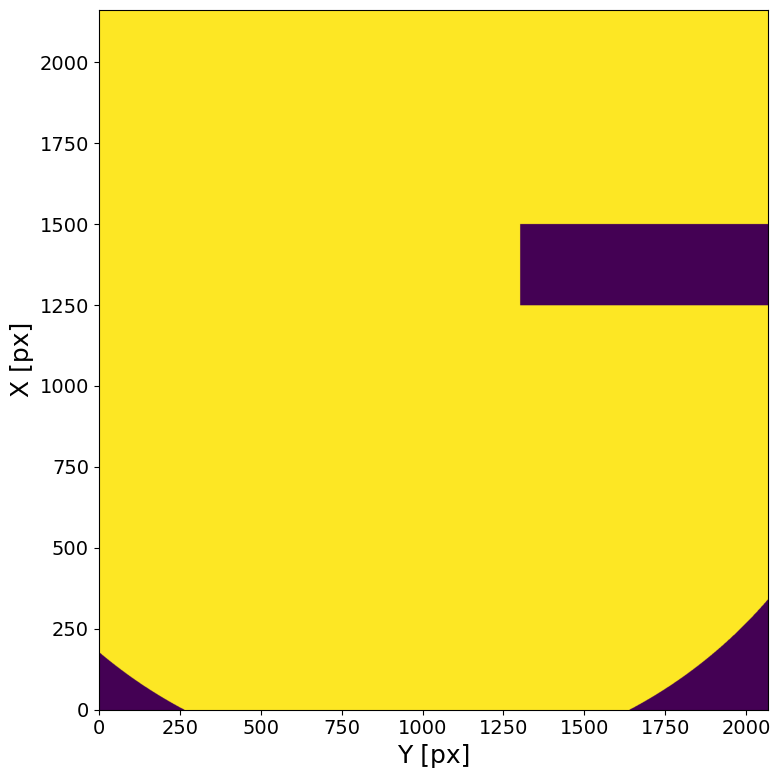

In [9]:
bs_mask = XPCS.gen_mask(mask_geom=geom)

## XPCS scan 4 analyisis

In [10]:
#######################################
sample_name = 'GeO2_7_30C'
Ndataset = 3
Nscan = 3
#######################################

In [11]:
#######################################
Nfi, Nff = 1000, None
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 33.01 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00024.h5 (25/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00025.h5 (26/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_0000

	 -> loading file eiger4m_v2_sparse_frame_0_00051.h5 (52/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00052.h5 (53/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00053.h5 (54/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00054.h5 (55/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00055.h5 (56/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00056.h5 (57/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00057.h5 (58/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00058.h5 (59/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00059.h5 (60/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00060.h5 (61/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00061.h5 (62/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00062.h5 (63/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00063.h5 (64/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00064.h5 (65/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_0006

In [12]:
####################
Lbin = 1
Nstep = 1000
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep))

<SecondaryAxis: >

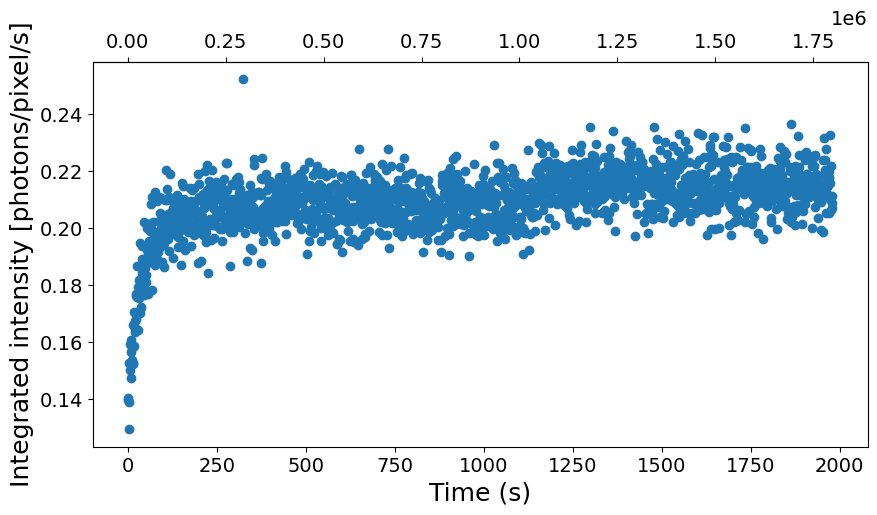

In [13]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0, 3000)

## BKG scan 4 analyisis

In [14]:
#######################################
sample_name_bkg = 'GeO2_6q_delcoup_1'
Ndataset_bkg = 1
Nscan_bkg = 2
#######################################

In [15]:
#######################################
Nfi, Nff = int(2.7e6), None
#######################################

scan_bkg = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei_bkg = scan_bkg['monoe']
itime_bkg = scan_bkg['fast_timer_period'][0]
theta_bkg = scan_bkg['delcoup']
Q_bkg = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan_bkg['command'])
print('Ei =', Ei_bkg)
print('itime =', itime_bkg)
print('theta =', theta_bkg)
print('Q =', Q_bkg)
print('T = {:.2f} min'.format(len(scan_bkg['fast_timer_period'])*itime_bkg/60))   
print('#############################\n')

e4m_data_bkg = ID10.load_sparse_e4m(RAW_folder, sample_name_bkg, Ndataset_bkg, Nscan_bkg, Nfi, Nff,  n_jobs=50)
e4m_data_bkg = COSMIC.fast_gamma_filter(e4m_data_bkg, Imaxth_high=10)

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 33.01 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00540.h5 (541/123 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00541.h5 (542/123 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00542.h5 (543/123 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00543.h5 (544/123 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00544.h5 (545/123 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00545.h5 (546/123 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00546.h5 (547/123 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00547.h5 (548/123 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00548.h5 (549/123 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00549.h5 (550/123 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00550.h5 (551/123 loops)
	 -> loading file eiger4m_v2_sp

In [16]:
####################
Lbin = 1
Nstep = 100
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data_bkg, itime_bkg, mask=mask, Lbin=Lbin, Nstep=Nstep))

<SecondaryAxis: >

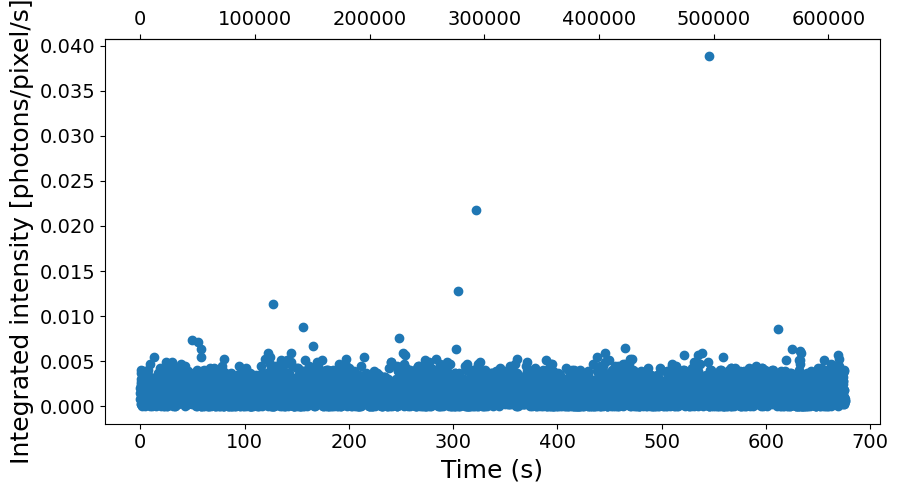

In [17]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

# Cosmic ray removal

In [ ]:
#CR, e4m_data_nocr = COSMIC.cosmic_filter(e4m_data,     Dpx=1, counts_th=1, itime=itime, Nfi=None, Nff=None)

Loading frames ...
Done! (elapsed time = 0.0 s)
Generating kernel matrix ...


Done! (elapsed time = 2.82 s)
Cosmic ray retrieval (using MKL library) ...
	 -> Kernel matrix multiplication ...


In [ ]:
#CR_bkg, e4m_data_bkg_nocr = COSMIC.cosmic_filter(e4m_data_bkg, Dpx=3, counts_th=2, itime=itime_bkg)

Loading frames ...
Done! (elapsed time = 0.0 s)
Generating kernel matrix ...
Done! (elapsed time = 5.86 s)
Cosmic ray retrieval (using MKL library) ...
	 -> Kernel matrix multiplication ...
	 -> Removing cosmic rays borders ...
	 -> Thresholding ...
Done! (elapsed time = 0.96 s)
	 | Cosmic ray signal intensity = 1.7246213 % ( 126.0 counts/s)
	 | # of cosmic rays (assumption of max 1 event per frame) = 1.0511664251876212 % of frames ( 9.556058410796556 events/s)
Removing cosmic rays ...
Done! (elapsed time = 0.03 s)


Text(0.5, 1.0, 'Cosmic ray retrieval')

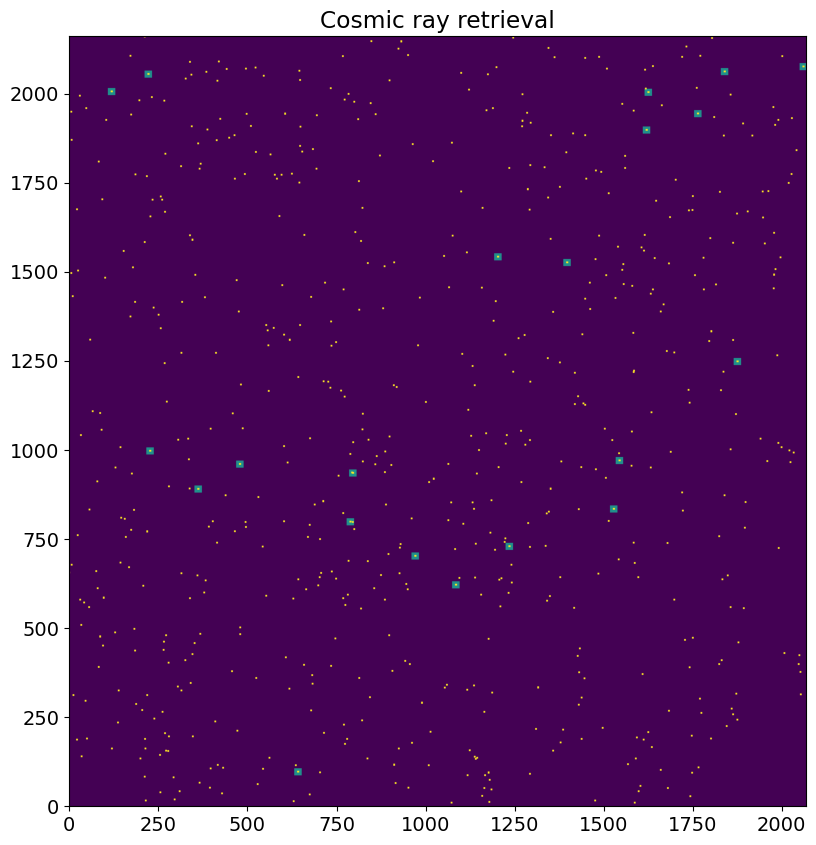

In [ ]:
i=3

imgA =e4m_data[i].toarray().reshape(Nx, Ny)
imgA = binary_dilation(imgA, structure=np.ones((5,5)), iterations=1)

imgB =CR[i].toarray().reshape(Nx, Ny)
imgB = binary_dilation(imgB, structure=np.ones((20,20)), iterations=1)

plt.figure(figsize=(10,10))
plt.imshow(imgB*.5+imgA, cmap='viridis', origin='lower', vmax=1)
plt.title('Cosmic ray retrieval')

Text(0.5, 1.0, 'Cosmic ray retrieval')

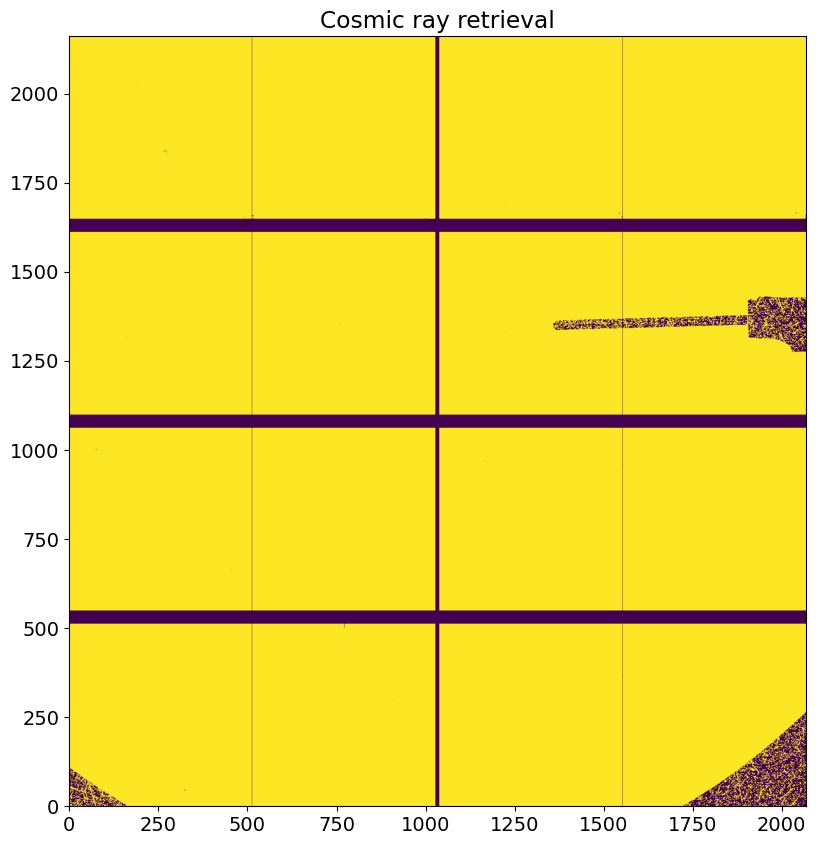

In [ ]:
img = CR.sum(axis=0).reshape(Nx, Ny)

from scipy.ndimage import binary_dilation
img = binary_dilation(img, structure=np.ones((2,2)), iterations=1)

plt.figure(figsize=(10,10))
plt.imshow(img, cmap='viridis', origin='lower', vmax=1)
plt.title('Cosmic ray retrieval')

# Generation of a flat field mask!

### Mask generation

In [18]:
##################
Ith_low=.20
Ith_high=.25
##################

#################################################
Masked area =  67.8277152217751 %
#################################################



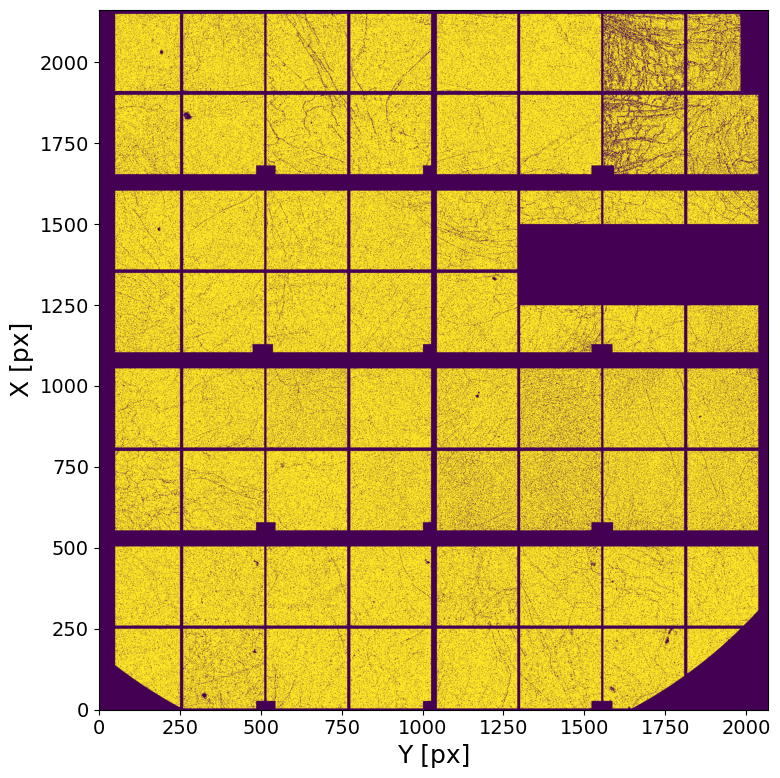

percentage of masked pixels only by ht: 9.77%


In [19]:
e4m_htmask = XPCS.gen_mask(e4m_data=e4m_data, itime=itime, mask=e4m_mask*bs_mask, Ith_high=Ith_high, Ith_low=Ith_low, Nfi=None, Nff=None, hist_plots=False)
np.save(MASKS_folder  + f'e4m_htmask-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}.npy', e4m_htmask)

print('percentage of masked pixels only by ht: {:.2f}%'.format(((~e4m_htmask).sum()-(~(e4m_mask*bs_mask)).sum())/Npx*100))

### Flux profile with mask=e4m_mask*bs_mask

################################################################################
Maximum count in the whole run -> 5.0
# of pixels above Ith_high treshold ->  289354 pixels (of 4471016 => 8.34 %)
# of pixels below Ith_low treshold ->  147518 pixels (of 4471016 => 4.25 %)
################################################################################



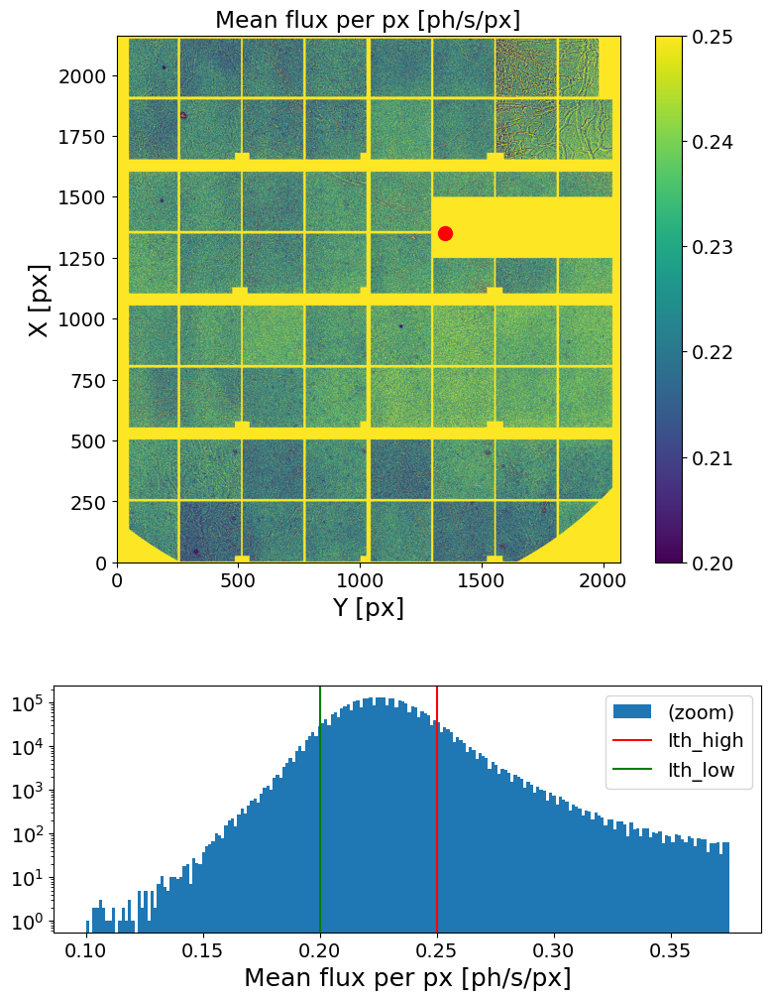

In [ ]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=Ith_low, Ith_high=Ith_high, Nfi=0, Nff=None, mask=e4m_mask*bs_mask)

### Flux profile with mask = e4m_mask * bs_mask * e4m_htmask_copper_foil

################################################################################
Maximum count in the whole run -> 5.0
# of pixels above Ith_high treshold ->  250889 pixels (of 4471016 => 7.54 %)
# of pixels below Ith_low treshold ->  124977 pixels (of 4471016 => 3.76 %)
################################################################################



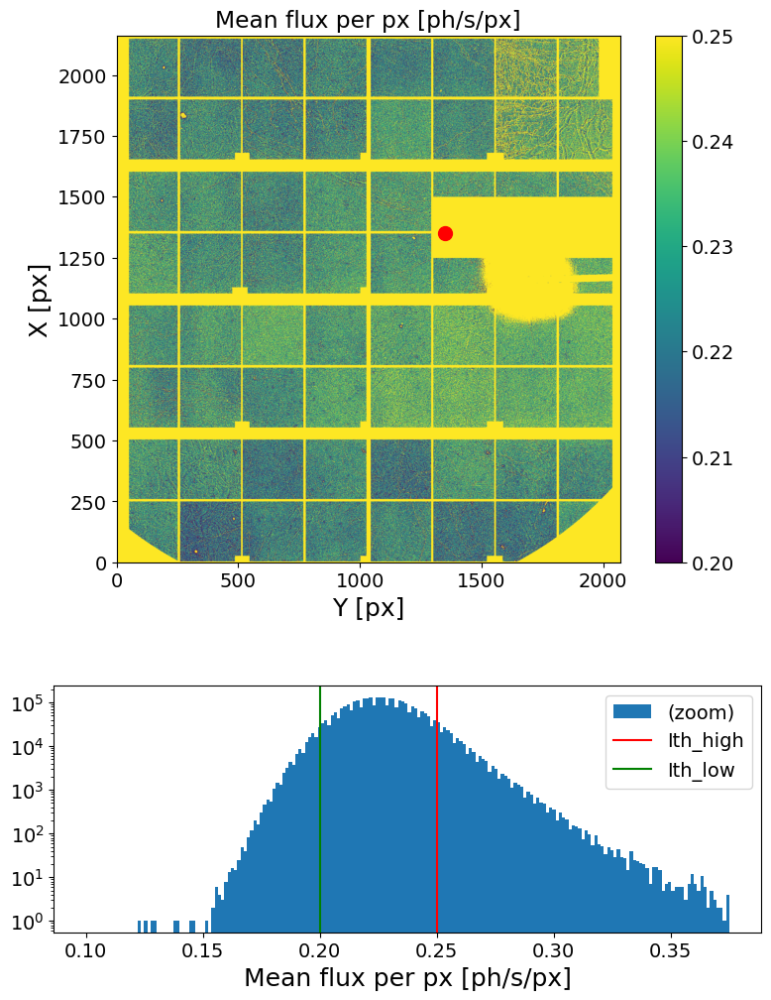

In [ ]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=Ith_low, Ith_high=Ith_high, Nfi=0, Nff=None, mask=e4m_mask*bs_mask*e4m_htmask_copper_foil)

# A better look to multiple event (k) statistic

In [20]:
# Gamma function
from scipy.special import gamma

# Poisson-Gamma distribution
P = lambda k, k_mean, beta: gamma(k+1/beta) / (gamma(1/beta)*gamma(k+1)) * (1+1/(k_mean*beta))**(-k) * (1+k_mean*beta)**(-1/beta)

In [21]:
k, k_nocr = {}, {}
k[1] = e4m_data == 1
k[2] = e4m_data == 2
k[3] = e4m_data == 3
k[4] = e4m_data == 4
#k_nocr[1] = e4m_data_nocr == 1
#k_nocr[2] = e4m_data_nocr == 2
#k_nocr[3] = e4m_data_nocr == 3
#k_nocr[4] = e4m_data_nocr == 4

k_p, k_p_nocr = {}, {}
k_p[1] = k[1].sum(axis=0)
k_p[2] = k[2].sum(axis=0)
k_p[3] = k[3].sum(axis=0)
k_p[4] = k[4].sum(axis=0)
#k_p_nocr[1] = k_nocr[1].sum(axis=0)
#k_p_nocr[2] = k_nocr[2].sum(axis=0)
#k_p_nocr[3] = k_nocr[3].sum(axis=0)
#k_p_nocr[4] = k_nocr[4].sum(axis=0)

k_bkg, k_bkg_nocr = {}, {}
k_bkg[1] = e4m_data_bkg == 1
k_bkg[2] = e4m_data_bkg == 2
k_bkg[3] = e4m_data_bkg == 3
k_bkg[4] = e4m_data_bkg == 4
#k_bkg_nocr[1] = e4m_data_bkg_nocr == 1
#k_bkg_nocr[2] = e4m_data_bkg_nocr == 2
#k_bkg_nocr[3] = e4m_data_bkg_nocr == 3
#k_bkg_nocr[4] = e4m_data_bkg_nocr == 4

k_p_bkg, k_p_bkg_nocr = {}, {}
k_p_bkg[1] = k_bkg[1].sum(axis=0)
k_p_bkg[2] = k_bkg[2].sum(axis=0)
k_p_bkg[3] = k_bkg[3].sum(axis=0)
k_p_bkg[4] = k_bkg[4].sum(axis=0)
#k_p_bkg_nocr[1] = k_bkg_nocr[1].sum(axis=0)
#k_p_bkg_nocr[2] = k_bkg_nocr[2].sum(axis=0)
#k_p_bkg_nocr[3] = k_bkg_nocr[3].sum(axis=0)
#k_p_bkg_nocr[4] = k_bkg_nocr[4].sum(axis=0)

In [22]:
import math
P_dist = lambda k,mu: (mu**k * np.exp(-mu)) / math.factorial(k)
mu = .23e-3

## k mask generation

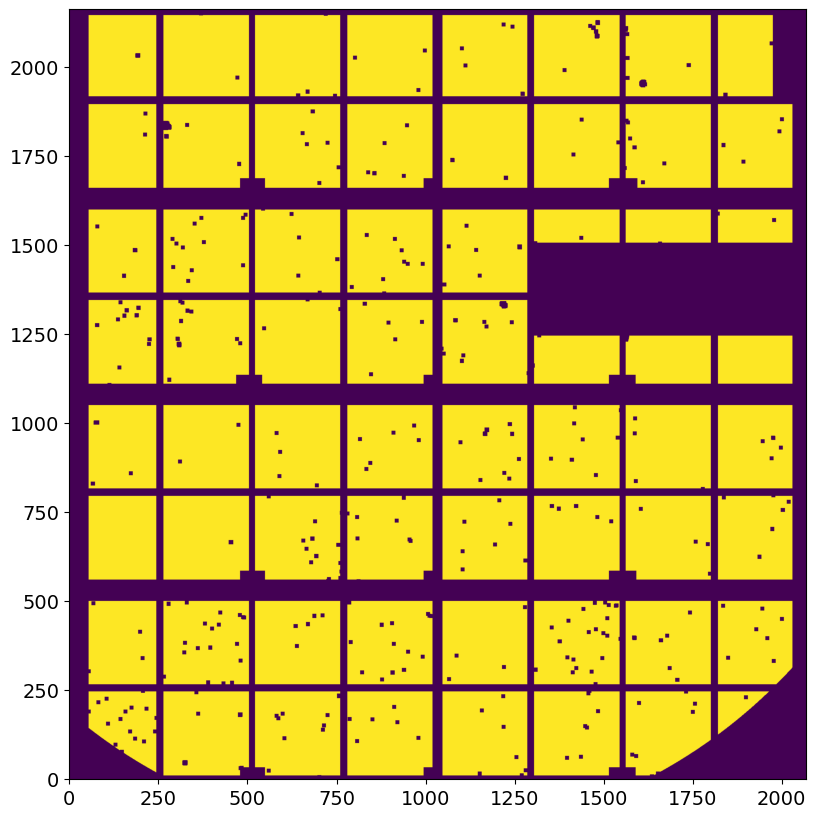

In [23]:
#################
w = 11
e4m_kmask = (k_p[2]<4)*(k_p[3]<3)*(k_p[4]==0) * (k_p[1]/e4m_data.shape[0]>.00013) * (k_p[1]/e4m_data.shape[0]<.0007) * e4m_mask*bs_mask
#################
from scipy.ndimage import binary_dilation
e4m_kmask = ~binary_dilation(~e4m_kmask.reshape(Nx, Ny), structure=np.ones((w,w)), iterations=1)
e4m_kmask = e4m_kmask.flatten()

np.save(MASKS_folder  + f'e4m_kmask-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}.npy', e4m_htmask)

plt.figure(figsize=(10,10))
plt.imshow(e4m_kmask.reshape(Nx,Ny), cmap='viridis', origin='lower')

## k = 1

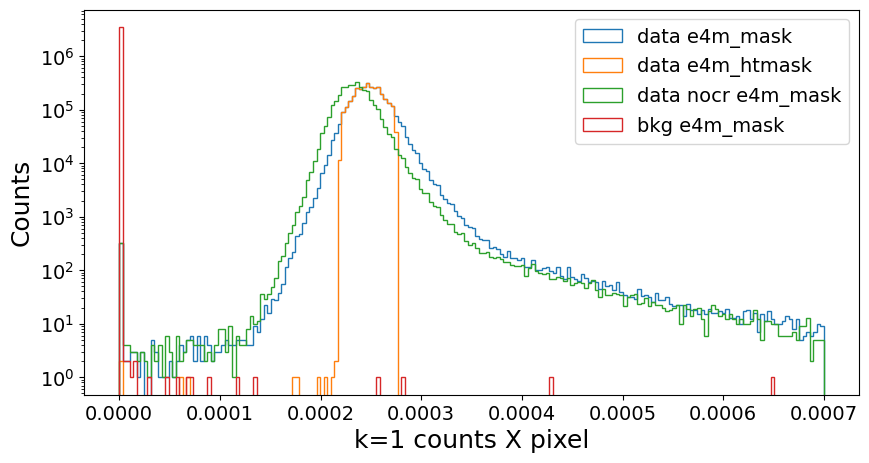

In [39]:
xrange = 0, .0007

plt.figure(figsize=(10,5))

plt.hist(k_p[1][e4m_mask*bs_mask]/e4m_data.shape[0],        bins=200, histtype='step', label='data e4m_mask', range=xrange)
plt.hist(k_p[1][e4m_htmask]/e4m_data.shape[0],                   bins=200, histtype='step', label='data e4m_htmask', range=xrange)
plt.hist(k_p_nocr[1][e4m_mask*bs_mask]/e4m_data_nocr.shape[0], bins=200, histtype='step', label='data nocr e4m_mask', range=xrange)

plt.hist(k_p_bkg[1][e4m_mask*bs_mask]/e4m_data_bkg.shape[0], bins=200, histtype='step', label='bkg e4m_mask', range=xrange)
#plt.hist(k_p_bkg_nocr[1][e4m_mask*bs_mask]/e4m_data_bkg_nocr.shape[0], bins=200, histtype='step', label='bkg nocr e4m_mask', range=xrange)

plt.xlabel('k=1 counts X pixel')
plt.ylabel('Counts')
plt.yscale('log')
plt.legend()

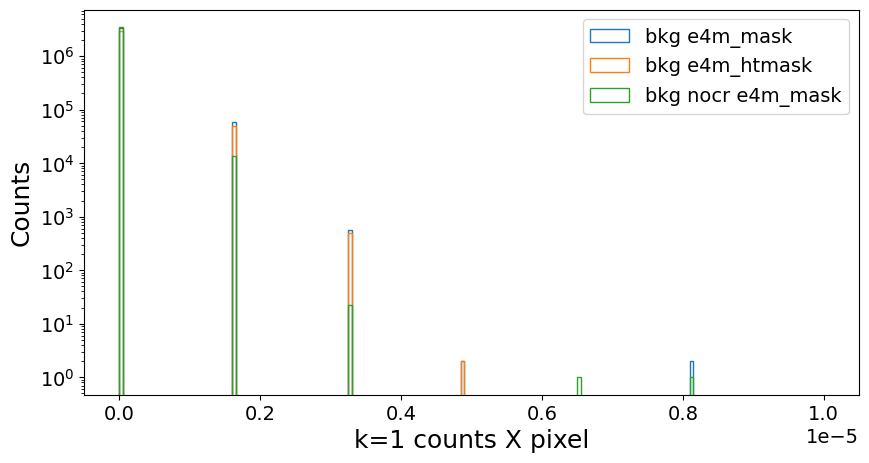

In [40]:
xrange = 0, .00001

plt.figure(figsize=(10,5))

plt.hist(k_p_bkg[1][e4m_mask*bs_mask]/e4m_data_bkg.shape[0], bins=200, histtype='step', label='bkg e4m_mask', range=xrange)
plt.hist(k_p_bkg[1][e4m_htmask]/e4m_data_bkg.shape[0],          bins=200, histtype='step', label='bkg e4m_htmask', range=xrange)
plt.hist(k_p_bkg_nocr[1][e4m_mask*bs_mask]/e4m_data_bkg.shape[0], bins=200, histtype='step', label='bkg nocr e4m_mask', range=xrange)

plt.xlabel('k=1 counts X pixel')
plt.ylabel('Counts')
plt.yscale('log')
plt.legend()

## k = 2

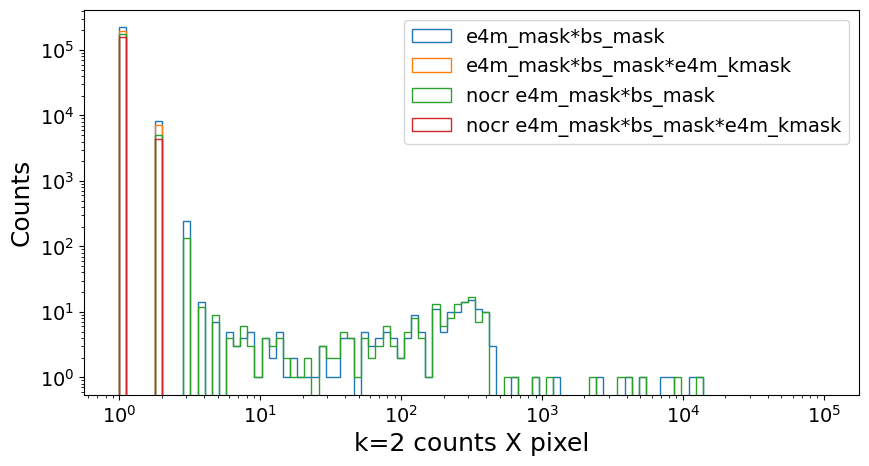

In [ ]:
plt.figure(figsize=(10,5))

bins = np.logspace(np.log10(1), np.log10(1e5), 100)
#bins=None

plt.hist(k_p[2][e4m_mask*bs_mask], bins=bins, histtype='step', label='e4m_mask*bs_mask')
plt.hist(k_p[2][e4m_mask*bs_mask*e4m_kmask], bins=bins, histtype='step', label='e4m_mask*bs_mask*e4m_kmask')
plt.hist(k_p_nocr[2][e4m_mask*bs_mask], bins=bins, histtype='step', label='nocr e4m_mask*bs_mask')
plt.hist(k_p_nocr[2][e4m_mask*bs_mask*e4m_kmask], bins=bins, histtype='step', label='nocr e4m_mask*bs_mask*e4m_kmask')


plt.xlabel('k=2 counts X pixel')
plt.ylabel('Counts')
plt.yscale('log')
plt.xscale('log')
plt.legend()

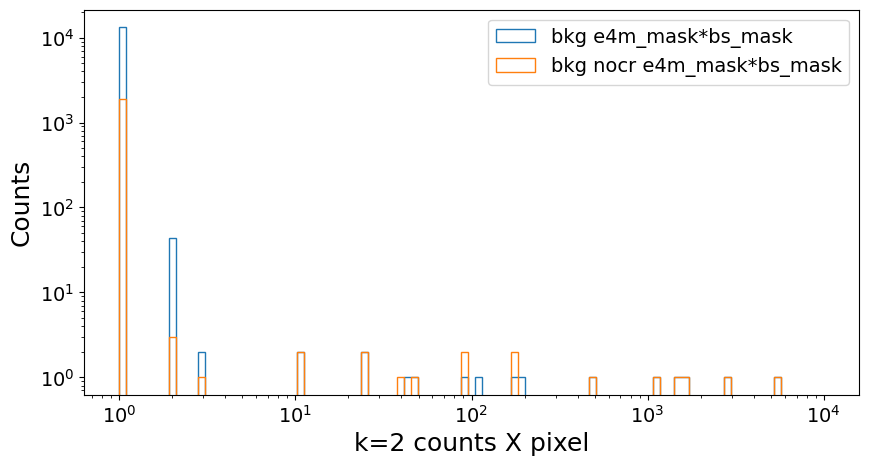

In [ ]:
plt.figure(figsize=(10,5))

bins = np.logspace(np.log10(1), np.log10(1e4), 100)

plt.hist(k_p_bkg[2][e4m_mask*bs_mask], bins=bins, histtype='step', label='bkg e4m_mask*bs_mask')
plt.hist(k_p_bkg_nocr[2][e4m_mask*bs_mask], bins=bins, histtype='step', label='bkg nocr e4m_mask*bs_mask')

plt.xlabel('k=2 counts X pixel')
plt.ylabel('Counts')
plt.yscale('log')
plt.xscale('log')
plt.legend()

## k = 3

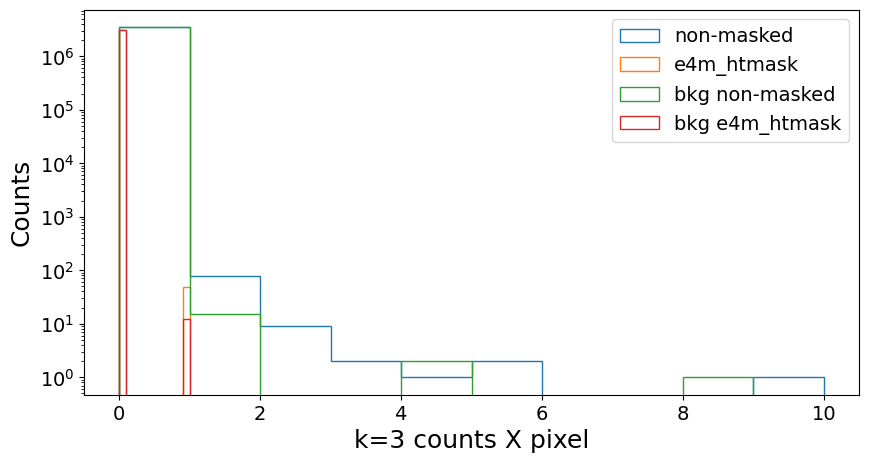

In [ ]:
plt.figure(figsize=(10,5))

plt.hist(k_p[3][e4m_mask*bs_mask],        bins=10, histtype='step', label='non-masked', range=(0,10))
plt.hist(k_p[3][e4m_htmask], bins=10, histtype='step', label='e4m_htmask')

plt.hist(k_p_bkg[3][e4m_mask*bs_mask], bins=10, histtype='step', label='bkg non-masked', range=(0,10))
plt.hist(k_p_bkg[3][e4m_htmask],          bins=10, histtype='step', label='bkg e4m_htmask')

plt.xlabel('k=3 counts X pixel')
plt.ylabel('Counts')
plt.yscale('log')
plt.legend()

## k = 4

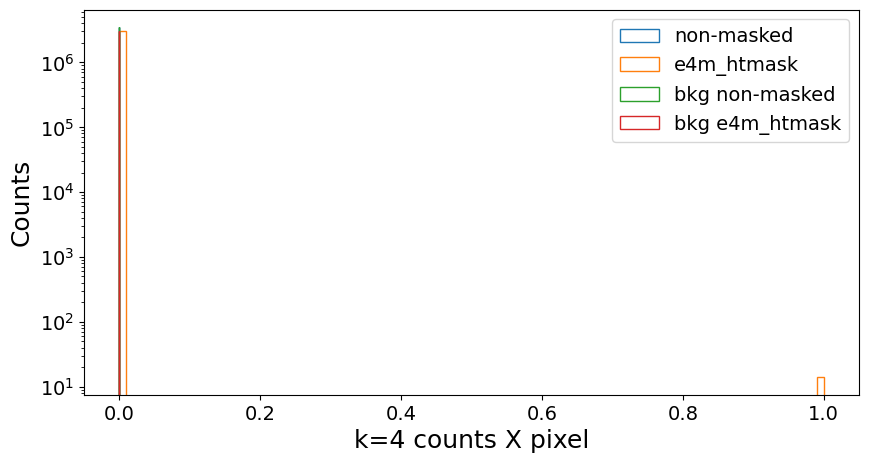

In [ ]:
plt.figure(figsize=(10,5))

plt.hist(k_p[4][e4m_mask*bs_mask],        bins=100, histtype='step', label='non-masked', range=(0,0.000001))
plt.hist(k_p[4][e4m_htmask], bins=100, histtype='step', label='e4m_htmask')


plt.hist(k_p_bkg[4][e4m_mask*bs_mask], bins=100, histtype='step', label='bkg non-masked', range=(0,0.000001))
plt.hist(k_p_bkg[4][e4m_htmask],          bins=100, histtype='step', label='bkg e4m_htmask', range=(0,0.000001))

plt.xlabel('k=4 counts X pixel')
plt.ylabel('Counts')
plt.yscale('log')
plt.legend()

# Single images k=2  has a lot of "background" noise
Envirormental noise can be seen within the k=2 high counts per px!

In reality all the images has noise, also the k=1.

## < k >

In [41]:
mask = e4m_mask*bs_mask*e4m_kmask*e4m_htmask

In [42]:
k_mean = e4m_data[:,mask].sum(axis=1)

(0.0, 2769.75)

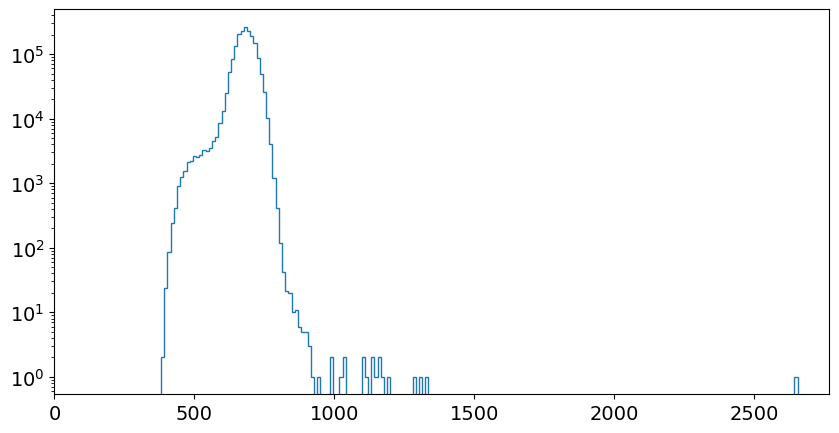

In [43]:
plt.figure(figsize=(10,5))
plt.hist(k_mean, bins=200, histtype='step',)
plt.yscale('log')
plt.xlim(0)

In [24]:
k_f, k_f_nocr = {}, {}
k_f[1] = k[1][:,mask].sum(axis=1)
k_f[2] = k[2][:,mask].sum(axis=1)
k_f[3] = k[3][:,mask].sum(axis=1)
k_f[4] = k[4][:,mask].sum(axis=1)
#k_f_nocr[1] = k_nocr[1][:,mask].sum(axis=1)
#k_f_nocr[2] = k_nocr[2][:,mask].sum(axis=1)
#k_f_nocr[3] = k_nocr[3][:,mask].sum(axis=1)
#k_f_nocr[3] = k_nocr[4][:,mask].sum(axis=1)

k_f_bkg, k_f_bkg_nocr = {}, {}
k_f_bkg[1] = k_bkg[1][:,mask].sum(axis=1)
k_f_bkg[2] = k_bkg[2][:,mask].sum(axis=1)
k_f_bkg[3] = k_bkg[3][:,mask].sum(axis=1)
k_f_bkg[4] = k_bkg[4][:,mask].sum(axis=1)
#k_f_bkg_nocr[1] = k_bkg_nocr[1][:,mask].sum(axis=1)
#k_f_bkg_nocr[2] = k_bkg_nocr[2][:,mask].sum(axis=1)
#k_f_bkg_nocr[3] = k_bkg_nocr[3][:,mask].sum(axis=1)
#k_f_bkg_nocr[4] = k_bkg_nocr[4][:,mask].sum(axis=1)

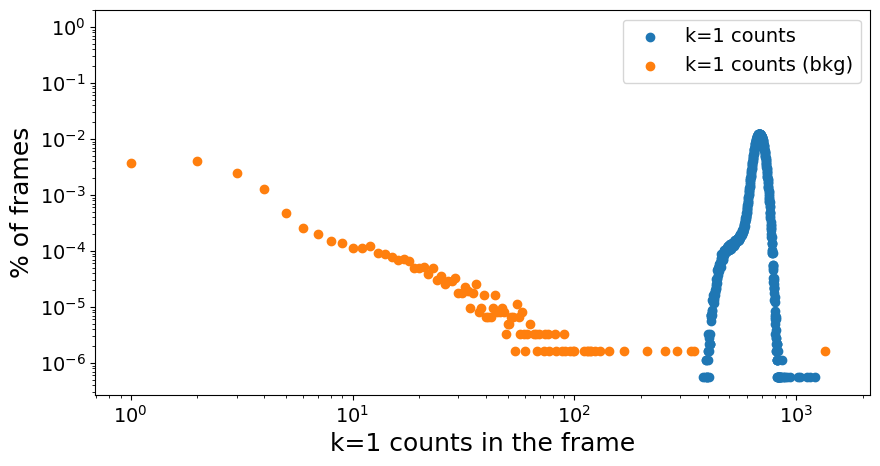

In [26]:
X = np.arange(0, 1500, 1)

plt.figure(figsize=(10,5))

Y = np.array([ (k_f[1]==i).sum() for i in X])
plt.scatter(X, Y/k[1].shape[0], label='k=1 counts')

#Y = np.array([ (k_f_nocr[1]==i).sum() for i in X])
#plt.scatter(X, Y/k[1].shape[0], label='k=1 counts (nocr)')

Y = np.array([ (k_f_bkg[1]==i).sum() for i in X])
plt.scatter(X, Y/k_bkg[1].shape[0], label='k=1 counts (bkg)')

#Y = np.array([ (k_f_bkg_nocr[1]==i).sum() for i in X])
#plt.scatter(X, Y/k_bkg[1].shape[0], label='k=1 counts (bkg nocr)')


plt.xlabel('k=1 counts in the frame')
plt.ylabel('% of frames')
plt.yscale('log')
plt.xscale('log')
plt.legend()

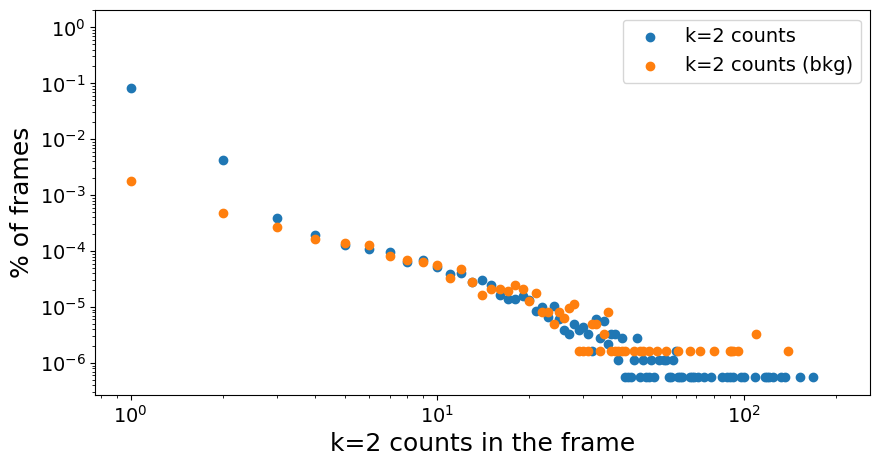

In [27]:
X = np.arange(0, 200, 1)

plt.figure(figsize=(10,5))

Y = np.array([ (k_f[2]==i).sum() for i in X])
plt.scatter(X, Y/k[1].shape[0], label='k=2 counts')

#Y = np.array([ (k_f_nocr[2]==i).sum() for i in X])
#plt.scatter(X, Y/k[1].shape[0], label='k=2 counts (nocr)')

Y = np.array([ (k_f_bkg[2]==i).sum() for i in X])
plt.scatter(X, Y/k_bkg[1].shape[0], label='k=2 counts (bkg)')

#Y = np.array([ (k_f_bkg_nocr[2]==i).sum() for i in X])
#plt.scatter(X, Y/k_bkg[1].shape[0], label='k=2 counts (bkg no cr)')

plt.xlabel('k=2 counts in the frame')
plt.ylabel('% of frames')
plt.yscale('log')
plt.xscale('log')
plt.legend()

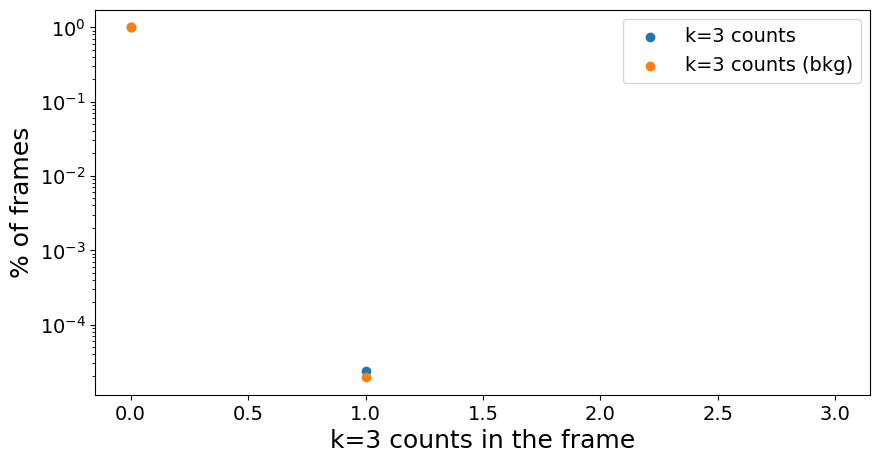

In [28]:
X = np.arange(0, 4, 1)

plt.figure(figsize=(10,5))

Y = np.array([ (k_f[3]==i).sum() for i in X])
plt.scatter(X, Y/k[1].shape[0], label='k=3 counts', s=20)

#Y = np.array([ (k_f_nocr[3]==i).sum() for i in X])
#plt.scatter(X, Y/k[1].shape[0], label='k=3 counts (nocr)')

Y = np.array([ (k_f_bkg[3]==i).sum() for i in X])
plt.scatter(X, Y/k_bkg[1].shape[0], label='k=3 counts (bkg)')

#Y = np.array([ (k_f_bkg_nocr[3]==i).sum() for i in X])
#plt.scatter(X, Y/k_bkg[1].shape[0], label='k=3 counts (bkg no cr)')

plt.xlabel('k=3 counts in the frame')
plt.ylabel('% of frames')
plt.yscale('log')
plt.legend()

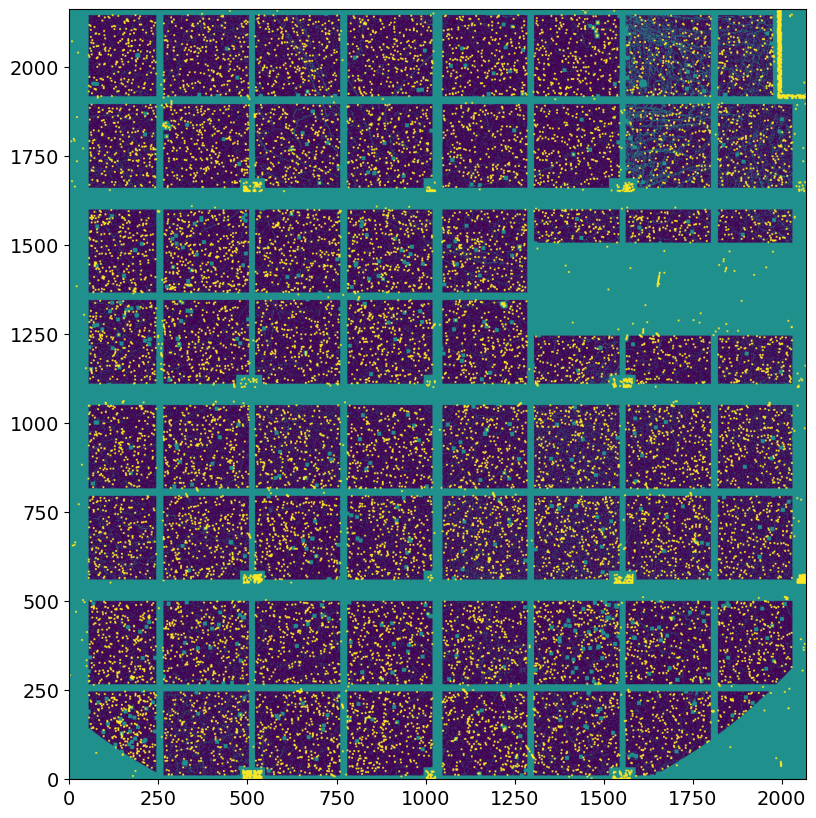

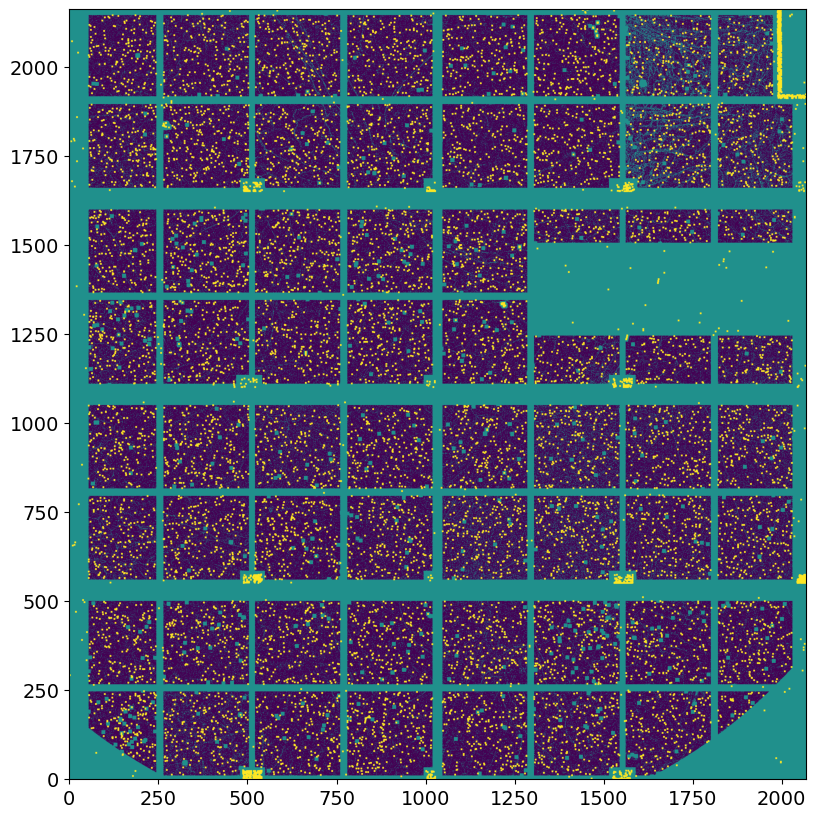

In [ ]:
#######################################################
idxs = np.where(((k[2][:,mask]).sum(axis=1) == 2))[0]
#######################################################

# WITH CR
img = k[2][idxs].sum(axis=0).reshape(Nx,Ny)
img = binary_dilation(img, structure=np.ones((5,5)), iterations=1)

plt.figure(figsize=(10,10))
plt.imshow(img + .5*~mask.reshape(Nx,Ny), cmap='viridis', origin='lower', vmax=1)

# # WITHOUT CR
# img = k_nocr[2][idxs].sum(axis=0).reshape(Nx,Ny)
# img = binary_dilation(img, structure=np.ones((5,5)), iterations=1)

# plt.figure(figsize=(10,10))
# plt.imshow(img + .5*~mask.reshape(Nx,Ny), cmap='viridis', origin='lower', vmax=1)

### Example

In [ ]:
#######################################################
idxs = np.where(((k[2][:,mask]).sum(axis=1) == 20))[0]
#######################################################

idx = idxs[0]

#### With CR

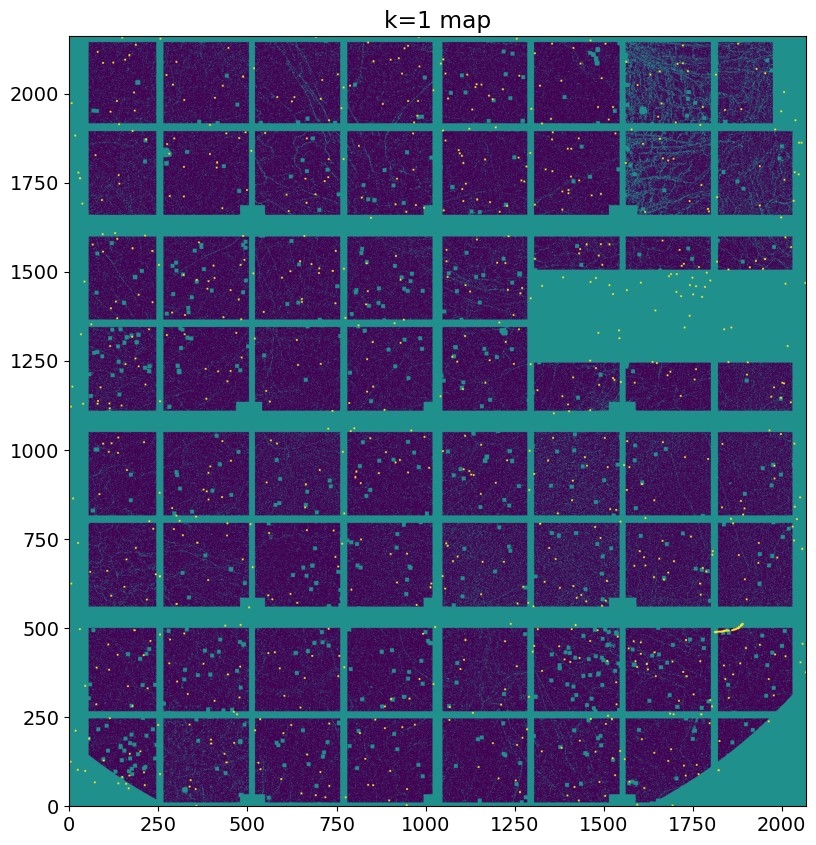

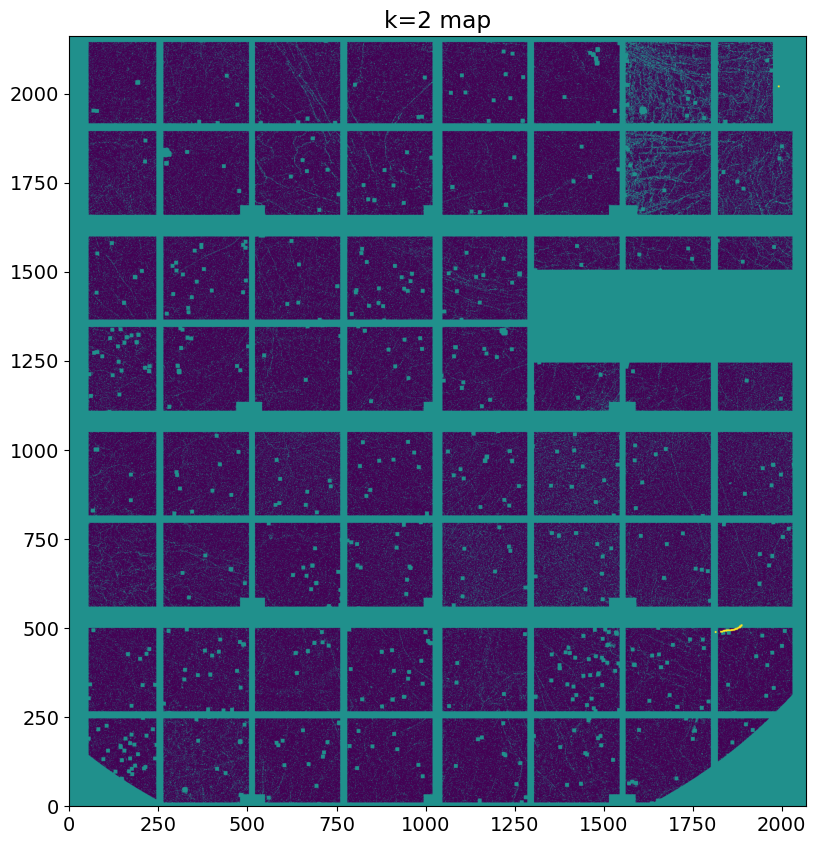

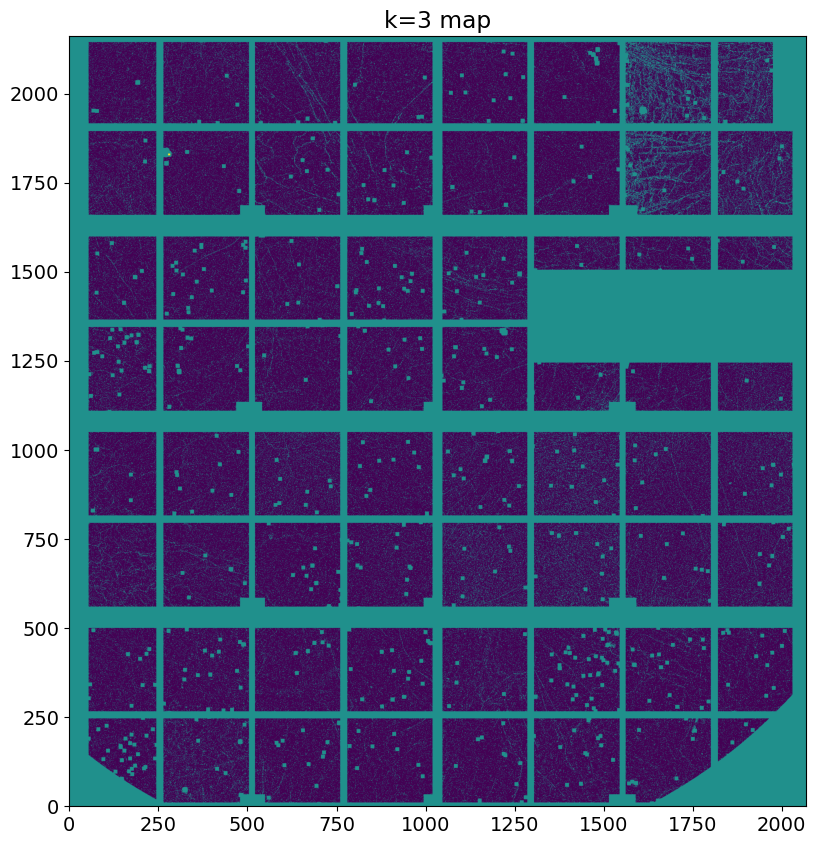

In [ ]:
img = k[1][idx].reshape(Nx,Ny).toarray()
# dilatate img for plot
img = binary_dilation(img, structure=np.ones((5,5)), iterations=1)
plt.figure(figsize=(10,10))
plt.title('k=1 map')
plt.imshow(img + .5*~mask.reshape(Nx,Ny), cmap='viridis', origin='lower', vmax=1)

img = k[2][idx].reshape(Nx,Ny).toarray()
# dilatate img for plot
img = binary_dilation(img, structure=np.ones((5,5)), iterations=1)
plt.figure(figsize=(10,10))
plt.title('k=2 map')
plt.imshow(img + .5*~mask.reshape(Nx,Ny), cmap='viridis', origin='lower', vmax=1)

img = k[3][idx].reshape(Nx,Ny).toarray()
# dilatate img for plot
img = binary_dilation(img, structure=np.ones((5,5)), iterations=1)
plt.figure(figsize=(10,10))
plt.title('k=3 map')
plt.imshow(img + .5*~mask.reshape(Nx,Ny), cmap='viridis', origin='lower', vmax=1)

#### CR removed

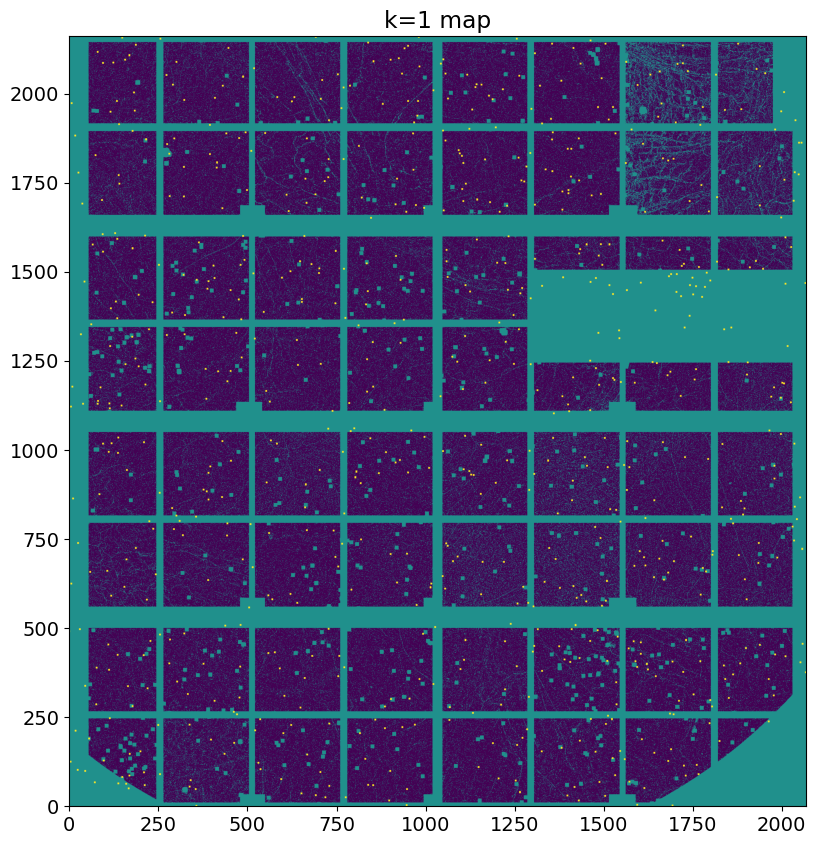

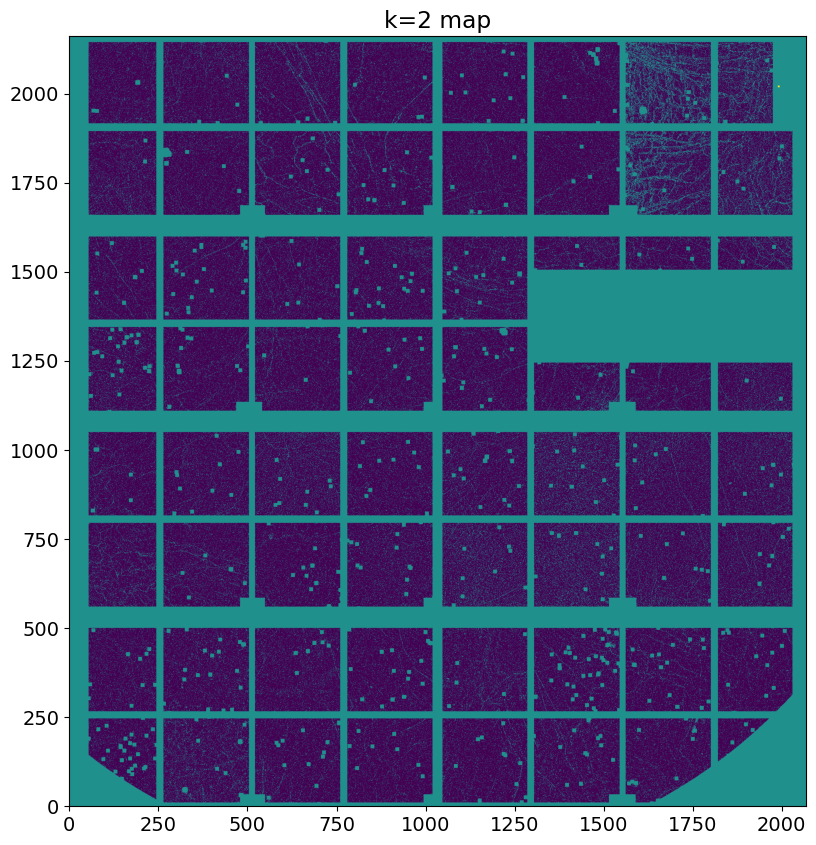

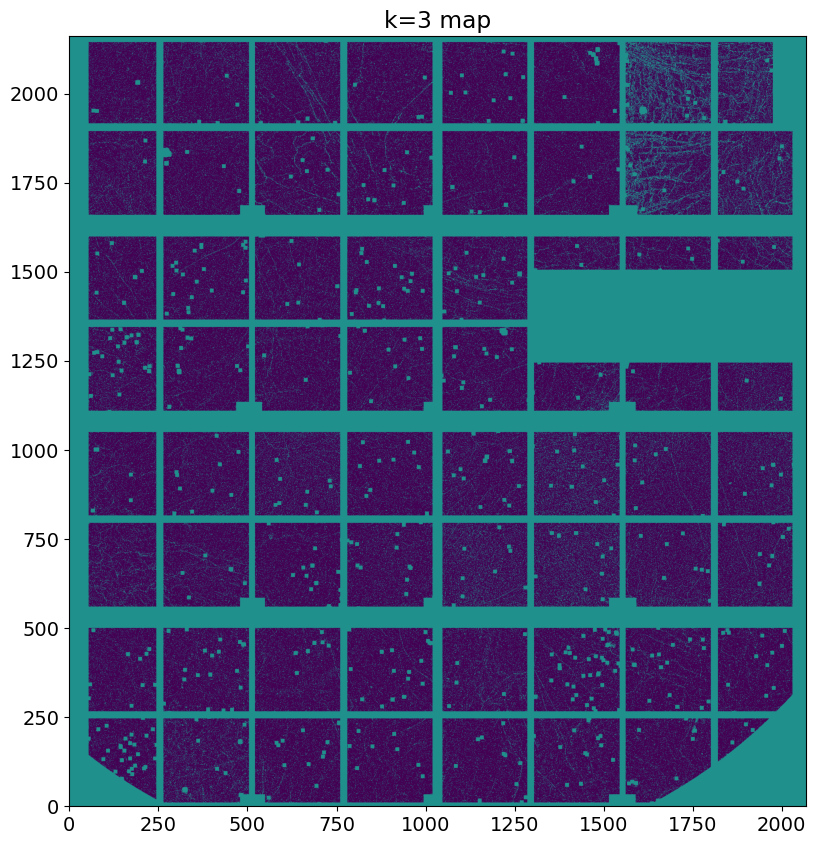

In [ ]:
img = k_nocr[1][idx].reshape(Nx,Ny).toarray()
# dilatate img for plot
img = binary_dilation(img, structure=np.ones((5,5)), iterations=1)
plt.figure(figsize=(10,10))
plt.title('k=1 map')
plt.imshow(img + .5*~mask.reshape(Nx,Ny), cmap='viridis', origin='lower', vmax=1)

img = k_nocr[2][idx].reshape(Nx,Ny).toarray()
# dilatate img for plot
img = binary_dilation(img, structure=np.ones((5,5)), iterations=1)
plt.figure(figsize=(10,10))
plt.title('k=2 map')
plt.imshow(img + .5*~mask.reshape(Nx,Ny), cmap='viridis', origin='lower', vmax=1)

img = k_nocr[3][idx].reshape(Nx,Ny).toarray()
# dilatate img for plot
img = binary_dilation(img, structure=np.ones((5,5)), iterations=1)
plt.figure(figsize=(10,10))
plt.title('k=3 map')
plt.imshow(img + .5*~mask.reshape(Nx,Ny), cmap='viridis', origin='lower', vmax=1)

## Background images!

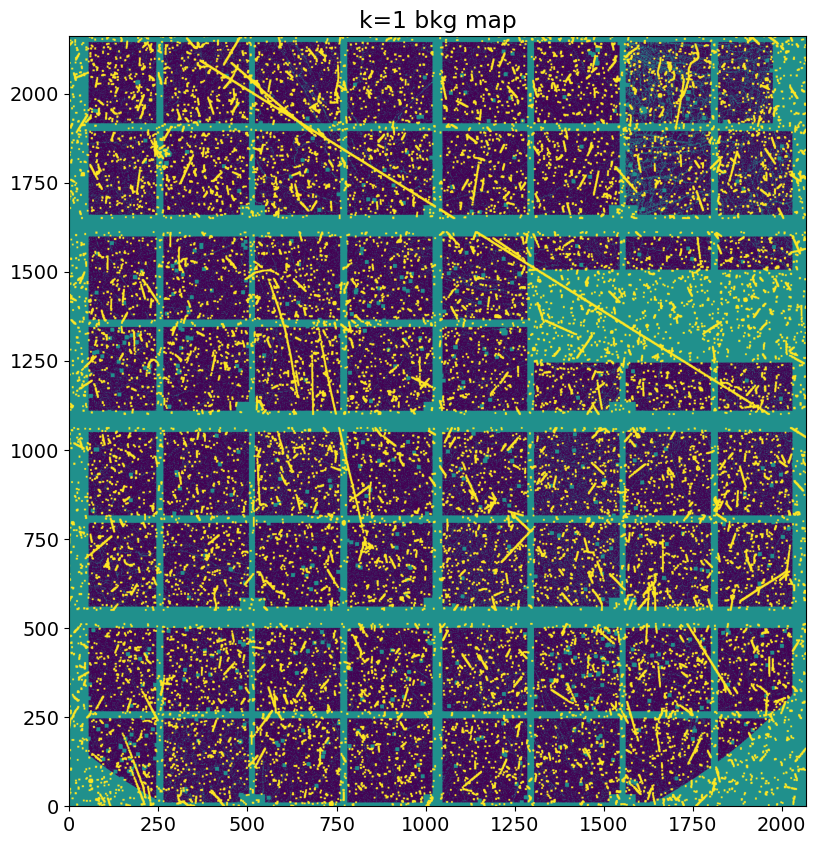

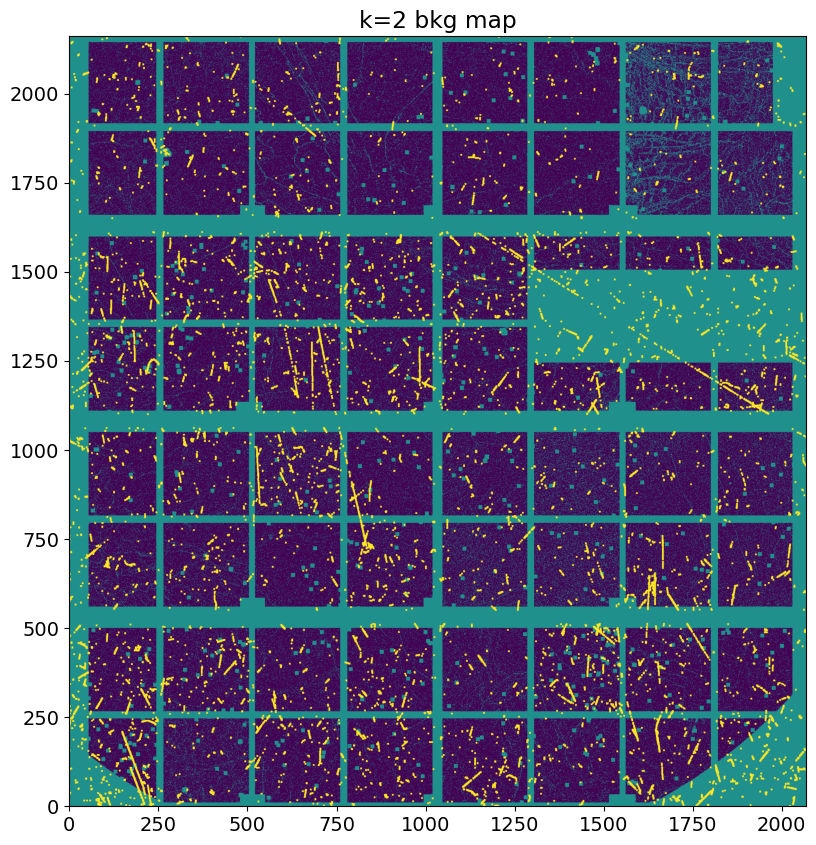

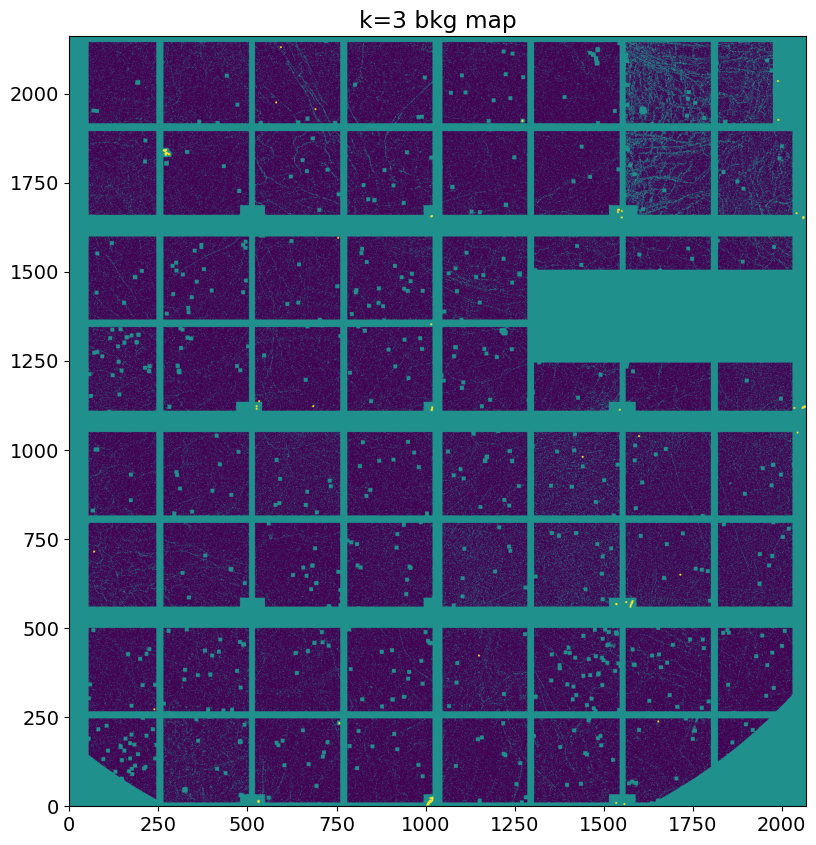

In [ ]:
img = k_p_bkg[1].reshape(Nx,Ny)
img = binary_dilation(img, structure=np.ones((5,5)),  iterations=1)

plt.figure(figsize=(10,10))
plt.title('k=1 bkg map')
plt.imshow(img + .5*~mask.reshape(Nx,Ny), cmap='viridis', origin='lower', vmax=1)

img = k_p_bkg[2].reshape(Nx,Ny)
img = binary_dilation(img, structure=np.ones((5,5)),  iterations=1)

plt.figure(figsize=(10,10))
plt.title('k=2 bkg map')
plt.imshow(img + .5*~mask.reshape(Nx,Ny), cmap='viridis', origin='lower', vmax=1)

img = k_p_bkg[3].reshape(Nx,Ny)
img = binary_dilation(img, structure=np.ones((5,5)),  iterations=1) 

plt.figure(figsize=(10,10))
plt.title('k=3 bkg map')
plt.imshow(img + .5*~mask.reshape(Nx,Ny), cmap='viridis', origin='lower', vmax=1)

img = k_p_bkg[4].reshape(Nx,Ny)
img = binary_dilation(img, structure=np.ones((5,5)),  iterations=1)

# A look to the correlation functions

In [ ]:
##### INPUTS #####
sparse_depth = 14
ch_depth = 4
mask = e4m_mask*bs_mask*e4m_kmask
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=mask, Nfi=int(.5e6), Nff=int(.5e6+2**18))
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=mask*e4m_htmask, Nfi=int(.5e6), Nff=int(.5e6+2**18))
g2mt_ht= np.vstack(XPCS.get_g2mt(itime, G2tmt))

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data_nocr, sparse_depth, ch_depth=ch_depth, mask=mask, Nfi=int(.5e6), Nff=int(.5e6+2**18))
g2mt_nocr = np.vstack(XPCS.get_g2mt(itime, G2tmt))

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data_bkg, sparse_depth, ch_depth=ch_depth, mask=mask, Nfi=None, Nff=int(2**18))
g2mt_bkg = np.vstack(XPCS.get_g2mt(itime_bkg, G2tmt))

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data_bkg_nocr, sparse_depth, ch_depth=ch_depth, mask=mask, Nfi=None, Nff=int(2**18))
g2mt_bkg_nocr = np.vstack(XPCS.get_g2mt(itime_bkg, G2tmt))


Loading frames ...
Done! (elapsed time = 3.92 s)
Masking data ...
Done! (elapsed time = 12.56 s)
	 | 262144 frames X 3107548 pixels
	 | sparsity = 2.48e-04
	 | memory usage (sparse.csr_array @ float32) = 2.263 GB
Computing sparse multitau G2t...


100%|██████████| 16/16 [00:48<00:00,  3.04s/it]


Done! (elapsed time = 49.0 s)
Computing dense multitau G2t...
	-> computing channels on 128 frames ...
	-> computing channels on 64 frames ...
	-> computing channels on 32 frames ...
Done! (elapsed time = 8.96 s)
Loading frames ...
Done! (elapsed time = 2.91 s)
Masking data ...
Done! (elapsed time = 11.86 s)
	 | 262144 frames X 2719538 pixels
	 | sparsity = 2.46e-04
	 | memory usage (sparse.csr_array @ float32) = 1.964 GB
Computing sparse multitau G2t...


100%|██████████| 16/16 [00:44<00:00,  2.77s/it]


Done! (elapsed time = 44.51 s)
Computing dense multitau G2t...
	-> computing channels on 128 frames ...
	-> computing channels on 64 frames ...
	-> computing channels on 32 frames ...
Done! (elapsed time = 7.64 s)
Loading frames ...
Done! (elapsed time = 2.67 s)
Masking data ...
Done! (elapsed time = 12.39 s)
	 | 262144 frames X 3107548 pixels
	 | sparsity = 2.34e-04
	 | memory usage (sparse.csr_array @ float32) = 2.131 GB
Computing sparse multitau G2t...


100%|██████████| 16/16 [00:48<00:00,  3.02s/it]


Done! (elapsed time = 48.55 s)
Computing dense multitau G2t...
	-> computing channels on 128 frames ...
	-> computing channels on 64 frames ...
	-> computing channels on 32 frames ...
Done! (elapsed time = 9.15 s)
Loading frames ...
Done! (elapsed time = 0.01 s)
Masking data ...
Done! (elapsed time = 0.03 s)
	 | 262144 frames X 3107548 pixels
	 | sparsity = 3.25e-08
	 | memory usage (sparse.csr_array @ float32) = 0.002 GB
Computing sparse multitau G2t...


100%|██████████| 16/16 [00:18<00:00,  1.17s/it]


Done! (elapsed time = 18.65 s)
Computing dense multitau G2t...
	-> computing channels on 128 frames ...
	-> computing channels on 64 frames ...
	-> computing channels on 32 frames ...
Done! (elapsed time = 8.63 s)
Loading frames ...
Done! (elapsed time = 0.01 s)
Masking data ...
Done! (elapsed time = 0.03 s)
	 | 262144 frames X 3107548 pixels
	 | sparsity = 6.84e-09
	 | memory usage (sparse.csr_array @ float32) = 0.002 GB
Computing sparse multitau G2t...


100%|██████████| 16/16 [00:18<00:00,  1.18s/it]


Done! (elapsed time = 18.85 s)
Computing dense multitau G2t...
	-> computing channels on 128 frames ...
	-> computing channels on 64 frames ...
	-> computing channels on 32 frames ...
Done! (elapsed time = 8.76 s)


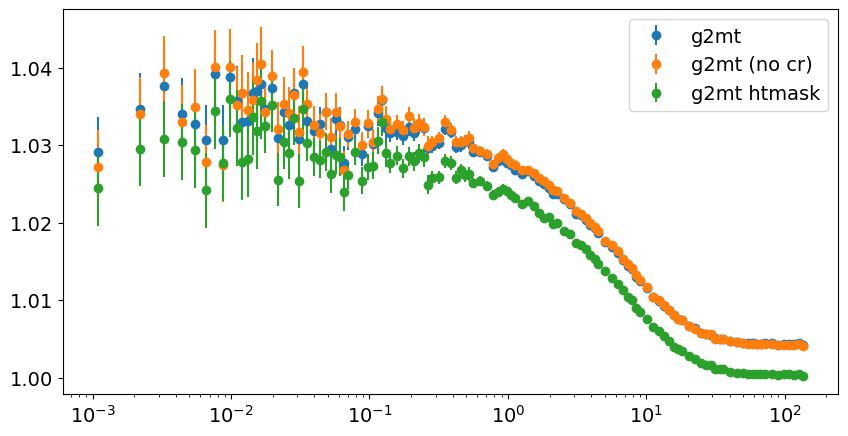

In [ ]:
plt.figure(figsize=(10,5))

plt.errorbar(g2mt[0], g2mt[1], yerr=g2mt[2], fmt='o', label='g2mt')
plt.errorbar(g2mt_nocr[0], g2mt_nocr[1], yerr=g2mt_nocr[2], fmt='o', label='g2mt (no cr)')
plt.errorbar(g2mt_ht[0], g2mt_ht[1], yerr=g2mt_ht[2], fmt='o', label='g2mt htmask')

plt.xscale('log')
plt.legend()

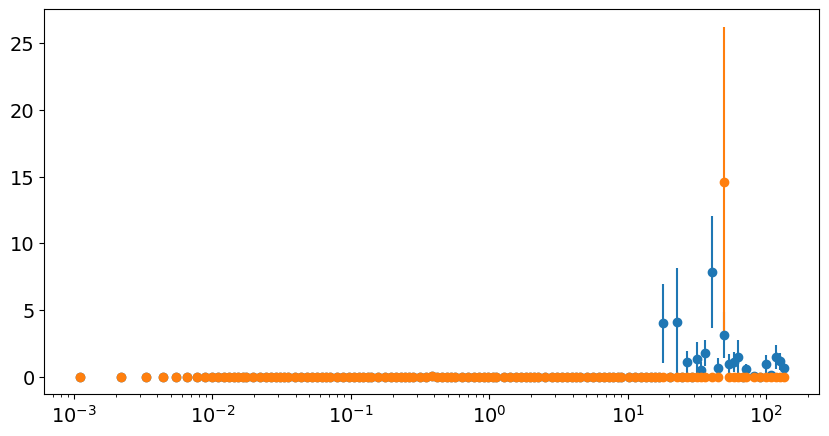

In [ ]:
plt.figure(figsize=(10,5))

plt.errorbar(g2mt_bkg[0], g2mt_bkg[1], yerr=g2mt_bkg[2], fmt='o', label='g2mt bkg')
plt.errorbar(g2mt_bkg_nocr[0], g2mt_bkg_nocr[1], yerr=g2mt_bkg_nocr[2], fmt='o', label='g2mt bkg (no cr)')

plt.xscale('log')
#plt.ylim(0,1.1)

# Try to quantify the variance of the spakle patternn

## Qmask definition

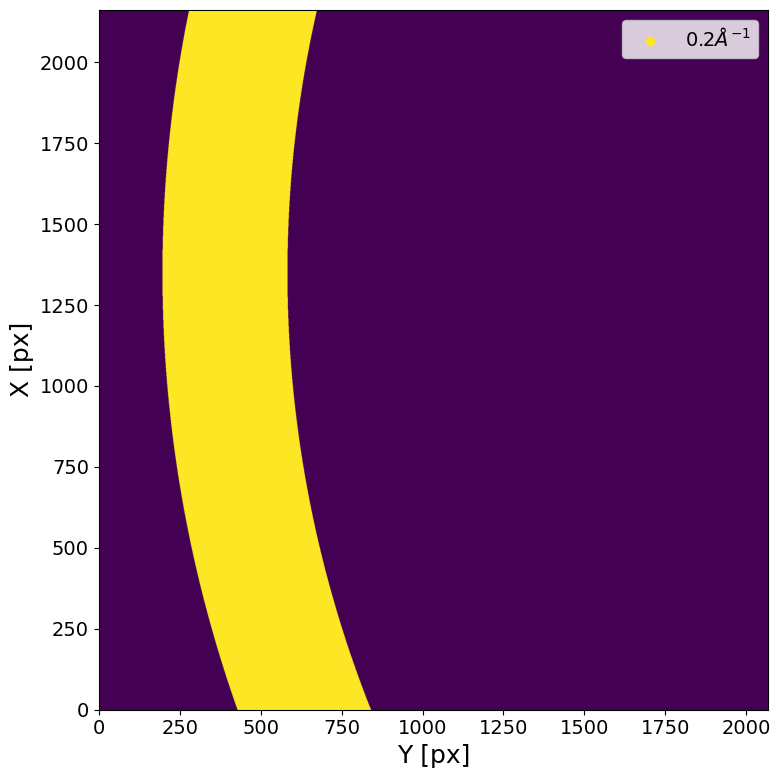

In [ ]:
###################
Q = .2
dQ = .01
###################

Qmask = XPCS.gen_Qmask(Ei, theta, Q, dQ, Qmap_plot=False)

## Data definition

In [ ]:
mask = e4m_mask*bs_mask*e4m_kmask*Qmask*e4m_htmask

Itp = e4m_data[int(.5e6):,mask]
It = Itp.sum(axis=1)/Itp.shape[1]

Itp_nocr = e4m_data_nocr[int(.5e6):,mask]
It_nocr = Itp_nocr.sum(axis=1)/Itp_nocr.shape[1]

Itp_bin = XPCS.bin_Itp(e4m_data[int(.5e6):,mask], Lbin=1000)
It_bin = Itp_bin.sum(axis=1)/Itp_bin.shape[1]

Itp_bin_nocr = XPCS.bin_Itp(e4m_data_nocr[int(.5e6):,mask], Lbin=1000)
It_bin_nocr = Itp_bin_nocr.sum(axis=1)/Itp_bin_nocr.shape[1]

Loading frames ...
Done! (elapsed time = 0.0 s)
Binning frames (Lbin = 1000, using MKL library) ...
Done! (elapsed time = 3.39 s)
	 | 1299 frames X 586240 pixels
	 | sparsity = 2.20e-01
	 | memory usage (sparse.csr_array @ float32) = 1.875 GB
Loading frames ...
Done! (elapsed time = 0.0 s)
Binning frames (Lbin = 1000, using MKL library) ...
Done! (elapsed time = 3.21 s)
	 | 1299 frames X 586240 pixels
	 | sparsity = 2.08e-01
	 | memory usage (sparse.csr_array @ float32) = 1.772 GB


## Spackle visibility

In [ ]:
beta01 = (Itp.shape[1]-Itp.count_nonzero(axis=1))/((Itp==1).sum(axis=1)) - 1/It

beta01_nocr = (Itp_nocr.shape[1]-Itp_nocr.count_nonzero(axis=1))/((Itp_nocr==1).sum(axis=1)) - 1/It_nocr

beta01_bin = (Itp_bin.shape[1]-Itp_bin.count_nonzero(axis=1)) / ((Itp_bin==1).sum(axis=1)) - 1/It_bin

beta_01_bin_nocr = (Itp_bin_nocr.shape[1]-Itp_bin_nocr.count_nonzero(axis=1)) / ((Itp_bin_nocr==1).sum(axis=1)) - 1/It_bin_nocr

beta2 = 2* ((Itp==2).sum(axis=1)/Itp.shape[1]) / It**2 -1

beta2_nocr = 2* ((Itp_nocr==2).sum(axis=1)/Itp_nocr.shape[1]) / It_nocr**2 -1

beta2_bin = 2* ((Itp_bin==2).sum(axis=1)/Itp_bin.shape[1]) / It_bin**2 -1

beta2_bin_nocr = 2* ((Itp_bin_nocr==2).sum(axis=1)/Itp_bin_nocr.shape[1]) / It_bin_nocr**2 -1

beta_var = ((Itp**2).sum()/ Itp.shape[1] - It**2) / It 

0.02556626857728278


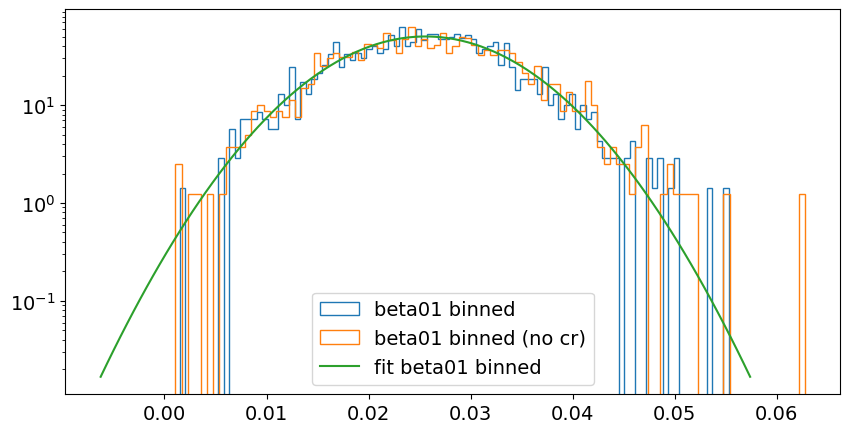

In [ ]:
plt.figure(figsize=(10,5))

#plt.hist(beta01, bins=100, histtype='step', label='beta01')
#plt.hist(beta01_nocr, bins=100, histtype='step', label='beta01 (no cr)', density=True, range=(0,100))
plt.hist(beta01_bin, bins=100, histtype='step', label='beta01 binned', density=True, )
plt.hist(beta_01_bin_nocr, bins=100, histtype='step', label='beta01 binned (no cr)', density=True)

#plt.hist(beta2, bins=100, histtype='step', label='beta2', density=True)
#plt.hist(beta2_nocr, bins=100, histtype='step', label='beta2 (no cr)', density=True)
#plt.hist(beta2_bin, bins=100, histtype='step', label='beta2 binned', density=True)
#plt.hist(beta2_bin_nocr, bins=100, histtype='step', label='beta2 binned (no cr)', density=True)

# gaussian fit with curve fit to both 
from scipy.stats import norm
mu, std = norm.fit(beta01_bin)
print(mu)
x = np.linspace(mu - 4*std, mu + 4*std, 100)
plt.plot(x, norm.pdf(x, mu, std), label='fit beta01 binned')

plt.yscale('log')
plt.legend()
#plt.ylim(1e-1)
#plt.xlim(-0.5, 0.5)